# Final Data Visualization Project
---

Course: Data Visualization

Submission Date: Mar 28, 2022

Student: Mathias Schindler

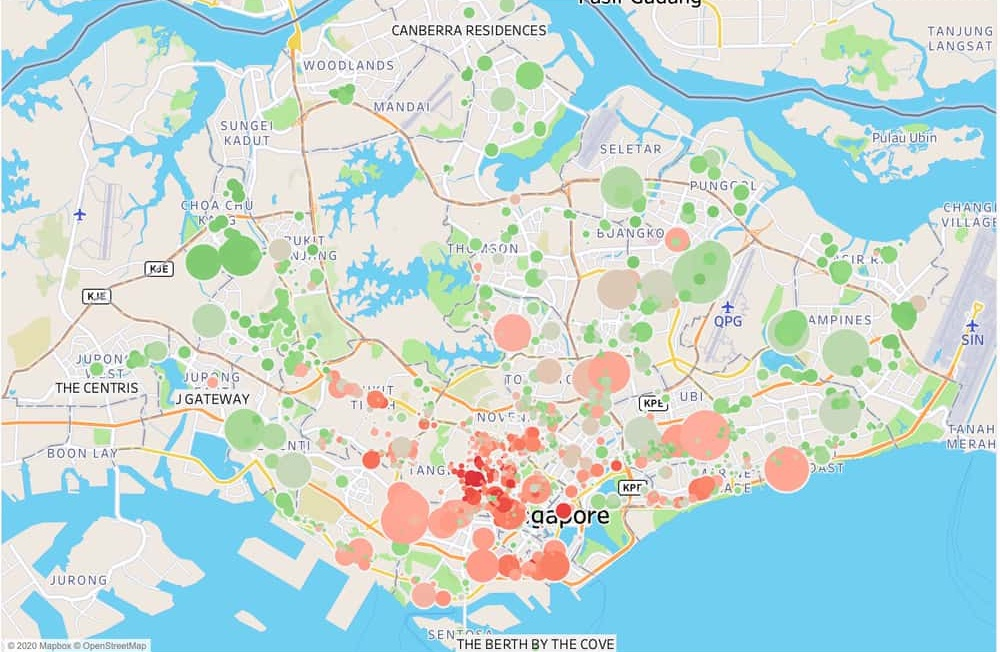

# Preamble

In [1]:
# Set R console language to English
Sys.setenv(LANG = "en")

In [2]:
# Load packages
library(plyr)
library(dplyr)
library(ggplot2)
library(ggpubr)
library(rgdal)
library(geojsonio)
library(lubridate)
library(cowplot)
library(leaflet)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:plyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘ggpubr’


The following object is masked from ‘package:plyr’:

    mutate


Loading required package: sp

Please note that rgdal will be retired by the end of 2023,
plan transition to sf/stars/terra functions using GDAL and PROJ
at your earliest convenience.

rgdal: version: 1.5-28, (SVN revision 1158)
Geospatial Data Abstraction Library extensions to R successfully loaded
Loaded GDAL runtime: GDAL 3.4.1, released 2021/12/27
Path to GDAL shared files: /Users/mathiasschindler/opt/anaconda3/envs/dataviz/share/gdal
GDAL binary built with GEOS: TRUE 
Loaded PROJ runtime: Rel. 8.2.1, January 1st, 2022, [PJ_VERSION: 821]
Path to PROJ shar

# Load Data

Link to explanation of column headers: [https://www.gov.uk/guidance/about-the-price-paid-data#explanations-of-column-headers-in-the-ppd](https://www.gov.uk/guidance/about-the-price-paid-data#explanations-of-column-headers-in-the-ppd).

In [3]:
# Set path
path = "/Users/mathiasschindler/Library/Mobile Documents/com~apple~CloudDocs/BSE/_T2-Data Viz/FinalProject/data"

In [4]:
# Full dataset
# file = paste(path, "pp-complete.csv", sep = "/") 
# df = read.csv(file)
# head(df, 5)

# Subsample - when developing code / check code runs
file = paste(path, "ppdata_subs.csv", sep = "/") 
df = read.csv(file)
head(df, 5)

,transaction_unique_identifier,price,date_of_transfer,postcode,property_type,old_new,duration,PAON,SAON,street,locality,town_city,district,county,PPD_category_type,record_status
,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,{24EDE89B-CC0D-4990-9CBB-08F4739C4674},249950,2005-11-28 00:00,M27 0AG,T,N,F,304,,WORSLEY ROAD,SWINTON,MANCHESTER,SALFORD,GREATER MANCHESTER,A,A
2,{4D84F030-6E32-4CA5-8F90-7C2EA2B517D6},290000,2005-06-10 00:00,B73 5NX,S,N,F,66,,EASTERN ROAD,SUTTON COLDFIELD,SUTTON COLDFIELD,BIRMINGHAM,WEST MIDLANDS,A,A
3,{2A289EA0-AB7A-CDC8-E050-A8C063054829},140000,2002-05-30 00:00,LL75 8BQ,D,N,F,BANGOR HOUSE,,,,PENTRAETH,ISLE OF ANGLESEY,ISLE OF ANGLESEY,A,A
4,{6A9B863E-623E-4D5B-9DF9-F17C96F58EB1},150000,2005-08-05 00:00,L31 4JW,S,N,L,13,,BLACKHURST ROAD,LYDIATE,LIVERPOOL,SEFTON,MERSEYSIDE,A,A
5,{BF469C5B-4F9A-4A1C-9B00-BB4F44F66BB2},116000,2004-10-19 00:00,IP3 0NH,S,N,F,81,,LEVINGTON ROAD,IPSWICH,IPSWICH,IPSWICH,SUFFOLK,A,A


# A. Exploratory Analysis

## A1. Boxplots

<ins>Instructions</ins>
<br/>
For the 33 London boroughs create a box-plot (or several box-plots) that compares house prices between the boroughs. Can you think of a better way to compare borough house prices (please demonstrate)?

### A1.1 Prepare Data

In [5]:
# Value counts of London boroughs / districts
lon_bors = df$district[df$town_city == "LONDON"]
table(lon_bors)

# Number of boroughs for London in dataset
print(paste("#London boroughs: ", length(table(lon_bors))))

lon_bors
  BARKING AND DAGENHAM                 BARNET                 BEXLEY 
                    18                  10350                    622 
                 BRENT                BROMLEY                 CAMDEN 
                  5697                   2049                   8085 
        CITY OF LONDON    CITY OF WESTMINSTER                CROYDON 
                   845                  11996                   3287 
                EALING                ENFIELD          EPPING FOREST 
                  7581                   6277                     45 
             GREENWICH                HACKNEY HAMMERSMITH AND FULHAM 
                  9751                   7055                   8303 
              HARINGEY                 HARROW               HAVERING 
                  8718                      4                      1 
            HILLINGDON               HOUNSLOW              ISLINGTON 
                     2                   1827                   7491 
KENSINGTON 

[1] "#London boroughs:  33"


There are 33 distinct boroughs for London with variable `district` so it is the correct variable per the instructions.

In [6]:
# Subset dataframe to only London districts
df_lon = subset(df, 
                subset = town_city == "LONDON",
                select = c("price", "district", "town_city"))
head(df_lon, 10)

# Check only London is present
print(paste("Unique values in 'town_city': ", table(df_lon$town_city)))

# Double-check no. of boroughs
print(paste("Unique values in 'district': ", length(table(df_lon$district))))

,price,district,town_city
,<int>,<chr>,<chr>
15,133500,TOWER HAMLETS,LONDON
23,160000,HAMMERSMITH AND FULHAM,LONDON
36,430000,BARNET,LONDON
45,50950,SOUTHWARK,LONDON
53,102000,LEWISHAM,LONDON
85,284000,LAMBETH,LONDON
98,560000,TOWER HAMLETS,LONDON
101,218453,TOWER HAMLETS,LONDON
106,275000,CITY OF WESTMINSTER,LONDON


[1] "Unique values in 'town_city':  199400"
[1] "Unique values in 'district':  33"


### A1.2 Naïve Boxplot

In [7]:
# Set global plot options
options(repr.plot.width=16, repr.plot.height=7)
global_size = 14

Warning message:
“Removed 2193 rows containing non-finite values (stat_boxplot).”
Warning message in prettyNum(.Internal(format(x, trim, digits, nsmall, width, 3L, :
“'big.mark' and 'decimal.mark' are both '.', which could be confusing”


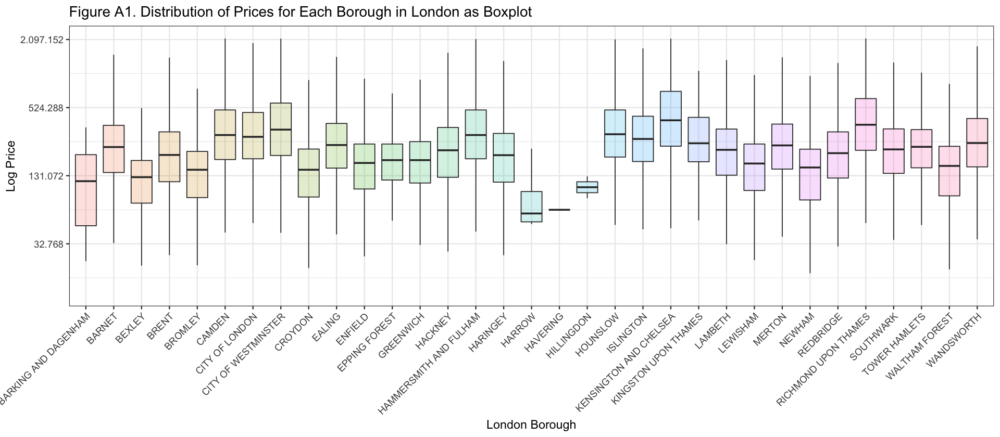

In [8]:
# Make boxplot
ggplot(df_lon, aes(x = as.factor(district), y = price, fill = district)) + 
    geom_boxplot(alpha = 0.2,
                outlier.shape = NA) + 
    scale_y_continuous(trans = 'log2', 
                       labels = function(x) format(x, big.mark = ".", scientific = FALSE),
                       limits = quantile(df_lon$price, c(0.001, 0.99))) +
    scale_x_discrete(guide = guide_axis(angle = 45)) +
    xlab("London Borough") +
    ylab("Log Price") +
    ggtitle("Figure A1. Distribution of Prices for Each Borough in London as Boxplot") + 
    theme_bw(base_size = global_size) +
    theme(legend.position = "none")

### A1.3 Violin Plot

In [9]:
ylims <- df_lon %>%
    group_by(district) %>%
    summarise(Q1 = quantile(price, 1/4), Q3 = quantile(price, 3/4)) %>%
    ungroup() %>%
    #get lowest Q1 and highest Q3
    summarise(lowQ1 = min(Q1), highQ3 = max(Q3))

# Adjust y limits
ylims$lowQ1  <- ylims$lowQ1*0.25
ylims$highQ3 <- ylims$highQ3*4
ylims

lowQ1,highQ3
<dbl>,<dbl>
11843.75,3492000


Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collapsing to unique 'x' values”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collapsing to unique 'x' values”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collapsing to unique 'x' values”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collapsing to unique 'x' values”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collapsing to unique 'x' values”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collapsing to unique 'x' values”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collapsing to unique 'x' values”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collapsing to unique 'x' values”
Warning mes

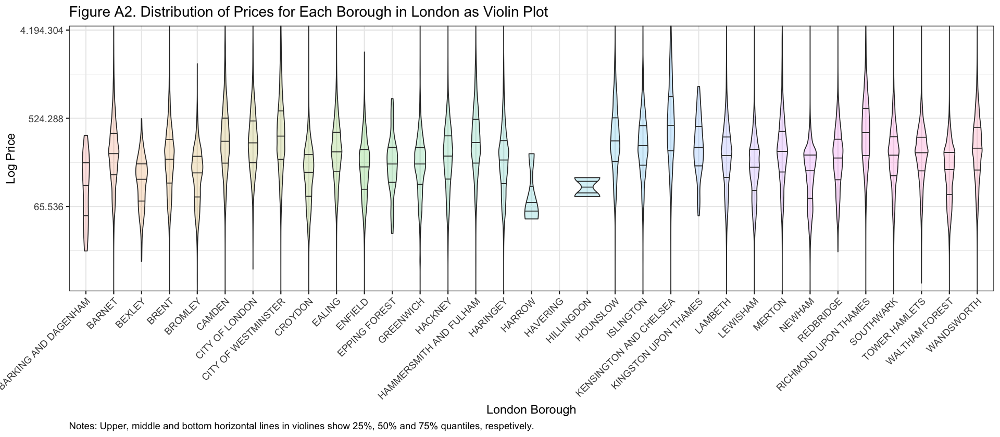

In [10]:
# Make violin plot
ggplot(df_lon, aes(x = as.factor(district), y = price, fill = district)) + 
    geom_violin(alpha = 0.2,
               draw_quantiles = c(0.25, 0.5, 0.75)) + 
    scale_y_continuous(trans = 'log2', 
                       labels = function(x) format(x, big.mark = ".", scientific = FALSE)) +
    scale_x_discrete(guide = guide_axis(angle = 45)) +
    coord_cartesian(ylim = as.numeric(ylims)) +
    xlab("London Borough") +
    ylab("Log Price") +
    ggtitle("Figure A2. Distribution of Prices for Each Borough in London as Violin Plot") +
    labs(caption = "Notes: Upper, middle and bottom horizontal lines in violines show 25%, 50% and 75% quantiles, respetively.") +
    theme_bw(base_size = global_size) +
    theme(legend.position = "none", plot.caption = element_text(hjust = 0)) 

### A1.4 Boxplot with Jitters

Warning message:
“Removed 2193 rows containing non-finite values (stat_boxplot).”
Warning message:
“Removed 130 rows containing missing values (geom_point).”
Warning message in prettyNum(.Internal(format(x, trim, digits, nsmall, width, 3L, :
“'big.mark' and 'decimal.mark' are both '.', which could be confusing”


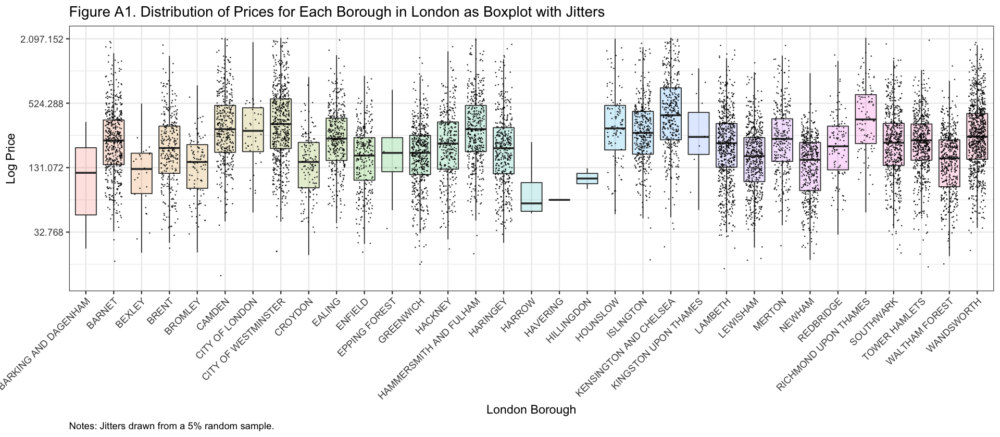

In [11]:
# Make boxplot with jitters
ggplot(df_lon, aes(x = as.factor(district), y = price, fill = district)) + 
    geom_boxplot(alpha = 0.2,
                outlier.shape = NA) + 
    geom_jitter(data = sample_frac(df_lon, size = 0.05),
                aes(x = factor(district), y = price, fill = NA), 
                size = 0.1, 
                alpha = 0.75,
                position = position_jitter(width = 0.3, height = 0.2),
                ) +
    scale_y_continuous(trans = 'log2', 
                       labels = function(x) format(x, big.mark = ".", scientific = FALSE),
                       limits = quantile(df_lon$price, c(0.001, 0.99))) +
    scale_x_discrete(guide = guide_axis(angle = 45)) +
    xlab("London Borough") +
    ylab("Log Price") +
    ggtitle("Figure A1. Distribution of Prices for Each Borough in London as Boxplot with Jitters") + 
    labs(caption = "Notes: Jitters drawn from a 5% random sample.") +
    theme_bw(base_size = global_size) +
    theme(legend.position = "none", plot.caption = element_text(hjust = 0)) 

## A2. Prices of Flats and Floor Level

<ins>Instructions</ins>
<br/>
Could the entire dataset be used to estimate the relationship between price of flats and floor level? If yes, how would you show that relationship in a plot?

In [12]:
head(df, 10)

,transaction_unique_identifier,price,date_of_transfer,postcode,property_type,old_new,duration,PAON,SAON,street,locality,town_city,district,county,PPD_category_type,record_status
,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,{24EDE89B-CC0D-4990-9CBB-08F4739C4674},249950,2005-11-28 00:00,M27 0AG,T,N,F,304,,WORSLEY ROAD,SWINTON,MANCHESTER,SALFORD,GREATER MANCHESTER,A,A
2,{4D84F030-6E32-4CA5-8F90-7C2EA2B517D6},290000,2005-06-10 00:00,B73 5NX,S,N,F,66,,EASTERN ROAD,SUTTON COLDFIELD,SUTTON COLDFIELD,BIRMINGHAM,WEST MIDLANDS,A,A
3,{2A289EA0-AB7A-CDC8-E050-A8C063054829},140000,2002-05-30 00:00,LL75 8BQ,D,N,F,BANGOR HOUSE,,,,PENTRAETH,ISLE OF ANGLESEY,ISLE OF ANGLESEY,A,A
4,{6A9B863E-623E-4D5B-9DF9-F17C96F58EB1},150000,2005-08-05 00:00,L31 4JW,S,N,L,13,,BLACKHURST ROAD,LYDIATE,LIVERPOOL,SEFTON,MERSEYSIDE,A,A
5,{BF469C5B-4F9A-4A1C-9B00-BB4F44F66BB2},116000,2004-10-19 00:00,IP3 0NH,S,N,F,81,,LEVINGTON ROAD,IPSWICH,IPSWICH,IPSWICH,SUFFOLK,A,A
6,{2A0727B5-91FF-43D0-9E88-5A798158BFDE},77500,2003-03-21 00:00,DE72 3FX,S,N,F,6,,CASTLE CLOSE,BORROWASH,DERBY,EREWASH,DERBYSHIRE,A,A
7,{FB3D946E-1D6D-482B-BD59-74565E28ED94},415000,2013-02-05 00:00,AL1 3XQ,T,N,F,36,,MARLBOROUGH ROAD,,ST ALBANS,ST ALBANS,HERTFORDSHIRE,A,A
8,{95ED3FE7-FFF2-4C1B-B947-6D4593D58C9B},250000,2010-01-06 00:00,UB4 8SA,S,N,F,389,,LANSBURY DRIVE,,HAYES,HILLINGDON,GREATER LONDON,A,A
9,{67992FDF-BB30-4787-A27B-01DAA4F48B8D},53000,1998-01-23 00:00,BS22 6RL,T,N,F,61,,VERBENA WAY,WESTON-SUPER-MARE,WESTON-SUPER-MARE,NORTH SOMERSET,NORTH SOMERSET,A,A


# B. Spatial Analysis

## B1. Create GeoJSON

<ins>Instructions</ins>
<br/>
Create a GeoJSON file where each postcode is represented with a latitude, longitude value, together with minimum, maximum, mean and median house price.

Mathias: Data of UK postcodes and latitude + longitude obtained from: [https://www.freemaptools.com/download-uk-postcode-lat-lng.htm](https://www.freemaptools.com/download-uk-postcode-lat-lng.htm).

In [13]:
# Dataframe with summary statistics for each postcode
codes_price <- df %>%
  group_by(postcode) %>%
  summarise_at(vars(price), list(price_min = min, price_max = max, price_mean = mean, price_median = median))

head(codes_price)

postcode,price_min,price_max,price_mean,price_median
<chr>,<int>,<int>,<dbl>,<dbl>
,750,44033000,280211.2,135000
AL1 1AJ,101950,435000,203018.4,159995
AL1 1AR,250000,350000,300000.0,300000
AL1 1AS,285000,500000,356666.7,285000
AL1 1BH,55500,187000,134500.0,170000
AL1 1BX,270000,1200000,731666.7,725000


In [14]:
# Load postcodes .csv-file
postcodes_file = paste(path, "ukpostcodes.csv", sep = "/") 
codes_lon_lat = read.csv(postcodes_file)

# Remove 'id' column for simplicity
codes_lon_lat <- subset(codes_lon_lat, select = c("postcode", "latitude", "longitude"))

# Display head
head(codes_lon_lat, 5)

,postcode,latitude,longitude
,<chr>,<dbl>,<dbl>
1,AB10 1XG,57.14417,-2.114848
2,AB10 6RN,57.13788,-2.121487
3,AB10 7JB,57.12427,-2.127190
4,AB11 5QN,57.14270,-2.093015
5,AB11 6UL,57.13755,-2.112696


In [15]:
#Check dimensions of dataframes
paste("No. of postcodes in longitude/latitude df:", nrow(codes_lon_lat))
paste("No. of postcodes in summary stats df:", nrow(codes_price))

[1] "No. of postcodes in longitude/latitude df: 1812402"

[1] "No. of postcodes in summary stats df: 820619"

In [16]:
# Merge long/lat with summary statistics
geojson = merge(x = codes_lon_lat, 
             y = codes_price, 
             by = "postcode",
             all.x = TRUE)  
head(geojson)

,postcode,latitude,longitude,price_min,price_max,price_mean,price_median
,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
1,AB10 1AA,57.14823,-2.096648,NA,NA,NA,NA
2,AB10 1AB,57.14930,-2.097262,NA,NA,NA,NA
3,AB10 1AF,57.14871,-2.097806,NA,NA,NA,NA
4,AB10 1AG,57.14823,-2.096648,NA,NA,NA,NA
5,AB10 1AH,57.14808,-2.094664,NA,NA,NA,NA
6,AB10 1AJ,57.14843,-2.097971,NA,NA,NA,NA


In [17]:
towns = subset(df, select = c("postcode", "town_city"))
maptest  <- merge(x = geojson, y = towns, by = "postcode", all.x = TRUE)
maptest <- na.omit(maptest) 
head(maptest)

,postcode,latitude,longitude,price_min,price_max,price_mean,price_median,town_city
,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>
17097,AL1 1AJ,51.74448,-0.3285997,101950,435000,203018.4,159995,ST. ALBANS
17098,AL1 1AJ,51.74448,-0.3285997,101950,435000,203018.4,159995,ST. ALBANS
17099,AL1 1AJ,51.74448,-0.3285997,101950,435000,203018.4,159995,ST. ALBANS
17100,AL1 1AJ,51.74448,-0.3285997,101950,435000,203018.4,159995,ST. ALBANS
17101,AL1 1AJ,51.74448,-0.3285997,101950,435000,203018.4,159995,ST. ALBANS
17102,AL1 1AJ,51.74448,-0.3285997,101950,435000,203018.4,159995,ST. ALBANS


In [18]:
# Calculate percentage of NaNs
na_pct <- sapply(geojson, function(x) sum(is.na(x)))/nrow(geojson)

# Print                 
print(format(round(na_pct, 2), 
             nsmall = 2))

    postcode     latitude    longitude    price_min    price_max   price_mean 
      "0.00"       "0.00"       "0.00"       "0.55"       "0.55"       "0.55" 
price_median 
      "0.55" 


In [19]:
# Remove postcodes with NaNs
geojson_export <- na.omit(geojson) 
head(geojson_export)

,postcode,latitude,longitude,price_min,price_max,price_mean,price_median
,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
17097,AL1 1AJ,51.74448,-0.3285997,101950,435000,203018.4,159995
17098,AL1 1AR,51.73955,-0.3174842,250000,350000,300000.0,300000
17099,AL1 1AS,51.74907,-0.3354707,285000,500000,356666.7,285000
17101,AL1 1BH,51.74685,-0.3380005,55500,187000,134500.0,170000
17104,AL1 1BX,51.74902,-0.3410646,270000,1200000,731666.7,725000
17106,AL1 1BZ,51.75036,-0.3403198,140000,390000,265000.0,265000


In [20]:
# Set coordinates from 'rgdal' package
coordinates(geojson_export) = c("latitude", "longitude")
class(geojson_export)

# Export file
out_path = "/Users/mathiasschindler/Library/Mobile Documents/com~apple~CloudDocs/BSE/_T2-Data Viz/FinalProject/out"
file_out = paste(out_path, "postcodes_lon_lat_sumstat.geojson", sep = "/")

writeOGR(geojson_export, 
         dsn = file_out, 
         layer = "geojson_export", 
         driver = "GeoJSON")

[1] "SpatialPointsDataFrame"
attr(,"package")
[1] "sp"

ERROR: Error in writeOGR(geojson_export, dsn = file_out, layer = "geojson_export", : layer exists, use a new layer name


## B2. GIS Application

<ins>Instructions</ins>
<br/>
Open the GeoJSON file in the GIS application of your choice and colour-code the data to give an overview of areas with high, medium and low median house price. Additionally, you can visualise this information as `cloropleths` or use `shiny` and add the information as markers on a map for a more interactive and impressive result.


**Online Resources**
<br/>
* [Open and Plot Geojson files in `R`](https://www.r-graph-gallery.com/325-background-map-from-geojson-format-in-r.html)
* [Choropleth map with `R` and `ggplot2`](https://www.r-graph-gallery.com/327-chloropleth-map-from-geojson-with-ggplot2.html) & [Choropleth map with `R`](https://www.r-graph-gallery.com/choropleth-map-in-r.html)
* [Choropleth Map with `R` and `leaflet`](https://www.r-graph-gallery.com/choropleth-map.html)

In [22]:
# 5 pct. random sample of postcodes to not kill memory
geojson_export <- na.omit(geojson) 
geojson_rndm  <- geojson_export %>% sample_frac(.05)

# Prettify numbers format
geojson_rndm['price_median'] <- lapply(geojson_rndm['price_median'], 
                                       prettyNum, 
                                       big.mark = ",", 
                                       scientific = FALSE)
geojson_rndm['price_mean'] <- lapply(geojson_rndm['price_mean'], 
                                       prettyNum, 
                                       big.mark = ",", 
                                       scientific = FALSE)
head(geojson_rndm)

,postcode,latitude,longitude,price_min,price_max,price_mean,price_median
,<chr>,<dbl>,<dbl>,<int>,<int>,<chr>,<chr>
1,CM6 1DJ,51.87297,0.3590101,145000,145000,"145,000","145,000"
2,WN8 7PJ,53.59038,-2.7746543,55000,178500,"116,750","116,750"
3,CA5 7BS,54.82371,-2.9918827,121000,131500,"126,250","126,250"
4,DL12 0TZ,54.64297,-2.1290715,42250,42250,"42,250","42,250"
5,YO12 5HP,54.29030,-0.4378689,50500,137500,"94,000","94,000"
6,NN5 6RD,52.25134,-0.9515341,128500,175000,"149,166.7","144,000"


In [43]:
leaflet(data = geojson_rndm) %>% 
    addTiles() %>%
    addCircleMarkers(clusterOptions = markerClusterOptions(),
               popup = ~paste("Local Postcode Median House Price:", "<br>", as.character(price_median)), 
               label = ~as.character(price_median))

Assuming "longitude" and "latitude" are longitude and latitude, respectively



HTML widgets cannot be represented in plain text (need html)

In [24]:
maptest_rndm <- maptest %>% sample_frac(.2)
maptest_rndm <- arrange(maptest_rndm, town_city, longitude, latitude)
maptest_rndm <- maptest_rndm %>% relocate(town_city, .after = postcode)
head(maptest_rndm)

,postcode,town_city,latitude,longitude,price_min,price_max,price_mean,price_median
,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
1,WD5 0DB,ABBOTS LANGLEY,51.70175,-0.4324445,148000,540000,328666.7,298000
2,WD5 0HF,ABBOTS LANGLEY,51.69919,-0.4317806,141000,227500,194625.0,205000
3,WD5 0HF,ABBOTS LANGLEY,51.69919,-0.4317806,141000,227500,194625.0,205000
4,WD5 0DE,ABBOTS LANGLEY,51.70048,-0.4317648,94000,322500,201750.0,220000
5,WD5 0DE,ABBOTS LANGLEY,51.70048,-0.4317648,94000,322500,201750.0,220000
6,WD5 0JE,ABBOTS LANGLEY,51.69716,-0.4303312,242500,350000,296250.0,296250


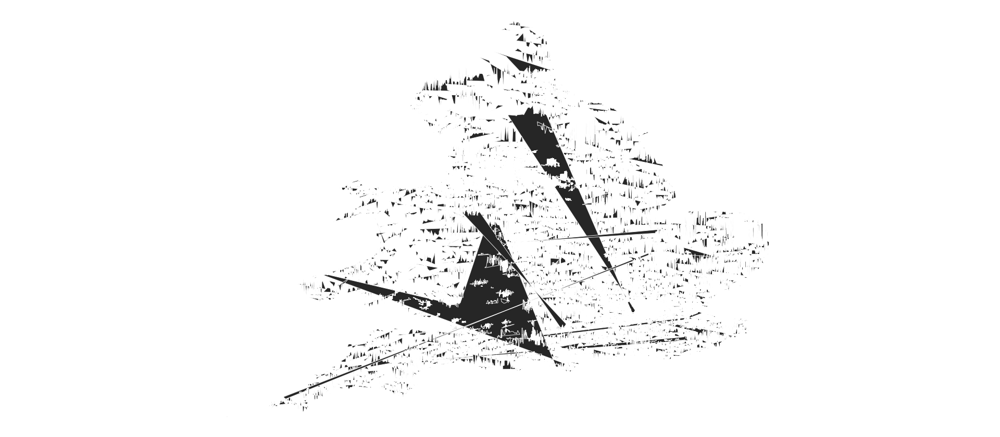

In [79]:
ggplot() + 
    geom_polygon(data = maptest_rndm, aes(x = longitude, y = latitude, group = town_city), 
                 color = "#FFFFFF", 
                 size = 0.25) +
    coord_fixed(1) + #This gives the map a nice 1:1 aspect ratio to prevent the map from appearing squashed
    theme_void()

## B3. Mean vs Median

<ins>Instructions</ins>
<br/>
Instead of using median price, you could have been asked to colour-code the mean house price. Would that have given a better view of the house prices across the UK? Please justify your answer.


Scale for 'x' is already present. Adding another scale for 'x', which will
replace the existing scale.

Scale for 'x' is already present. Adding another scale for 'x', which will
replace the existing scale.

Warning message:
“Removed 5975 rows containing non-finite values (stat_density).”
Warning message:
“Removed 5532 rows containing non-finite values (stat_density).”


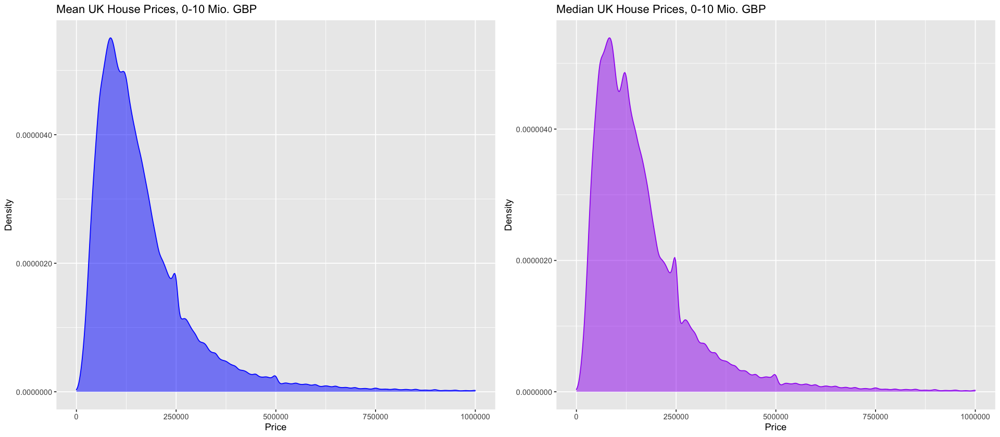

In [26]:
require(scales)

# Density plot of mean prices
p1 <- ggplot(data = geojson_export, aes(x = price_mean)) +
    geom_density(fill = "blue", 
                 color = "blue", 
                 alpha = 0.5) +
    scale_x_continuous(labels = comma) + 
    scale_y_continuous(labels = comma) +
    xlim(NA, 1000000) +
    xlab("Price") +
    ylab("Density") + 
    ggtitle("Mean UK House Prices, 0-10 Mio. GBP")

# Density plot of median prices
p2 <- ggplot(data = geojson_export, aes(x = price_median)) +
    geom_density(fill = "purple", 
                 color = "purple", 
                 alpha = 0.5) +
    scale_x_continuous(labels = comma) + 
    scale_y_continuous(labels = comma) +
    xlim(NA, 1000000) +
    xlab("Price") +
    ylab("Density") + 
    ggtitle("Median UK House Prices, 0-10 Mio. GBP")

# Combine 2 subplots
ggarrange(p1, p2)

# C. Temporal Analysis

## C1. Housing Price Development in 2015

<ins>Instructions</ins>
<br/>
Examine the house prices for 2015. How do these change over time? Do property prices seem to increase or decrease throughout the year?


In [27]:
# Suppress Warnings
defaultW <- getOption("warn") 
options(warn = -1) 

In [28]:
# Use lubridates function to remove time from 'date_of_transfer'
df$date_of_transfer <- as.Date(ymd_hm(df$date_of_transfer))
head(df)

# Any NaNs?
paste("# NaNs for date:", sum(is.na(df$date_of_transfer)) )

,transaction_unique_identifier,price,date_of_transfer,postcode,property_type,old_new,duration,PAON,SAON,street,locality,town_city,district,county,PPD_category_type,record_status
,<chr>,<int>,<date>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,{24EDE89B-CC0D-4990-9CBB-08F4739C4674},249950,2005-11-28,M27 0AG,T,N,F,304,,WORSLEY ROAD,SWINTON,MANCHESTER,SALFORD,GREATER MANCHESTER,A,A
2,{4D84F030-6E32-4CA5-8F90-7C2EA2B517D6},290000,2005-06-10,B73 5NX,S,N,F,66,,EASTERN ROAD,SUTTON COLDFIELD,SUTTON COLDFIELD,BIRMINGHAM,WEST MIDLANDS,A,A
3,{2A289EA0-AB7A-CDC8-E050-A8C063054829},140000,2002-05-30,LL75 8BQ,D,N,F,BANGOR HOUSE,,,,PENTRAETH,ISLE OF ANGLESEY,ISLE OF ANGLESEY,A,A
4,{6A9B863E-623E-4D5B-9DF9-F17C96F58EB1},150000,2005-08-05,L31 4JW,S,N,L,13,,BLACKHURST ROAD,LYDIATE,LIVERPOOL,SEFTON,MERSEYSIDE,A,A
5,{BF469C5B-4F9A-4A1C-9B00-BB4F44F66BB2},116000,2004-10-19,IP3 0NH,S,N,F,81,,LEVINGTON ROAD,IPSWICH,IPSWICH,IPSWICH,SUFFOLK,A,A
6,{2A0727B5-91FF-43D0-9E88-5A798158BFDE},77500,2003-03-21,DE72 3FX,S,N,F,6,,CASTLE CLOSE,BORROWASH,DERBY,EREWASH,DERBYSHIRE,A,A


[1] "# NaNs for date: 0"

In [29]:
# Set global plot options
options(repr.plot.width=16, repr.plot.height=7)
global_size = 14

### C1.1 UK House Prices, 1995-2018

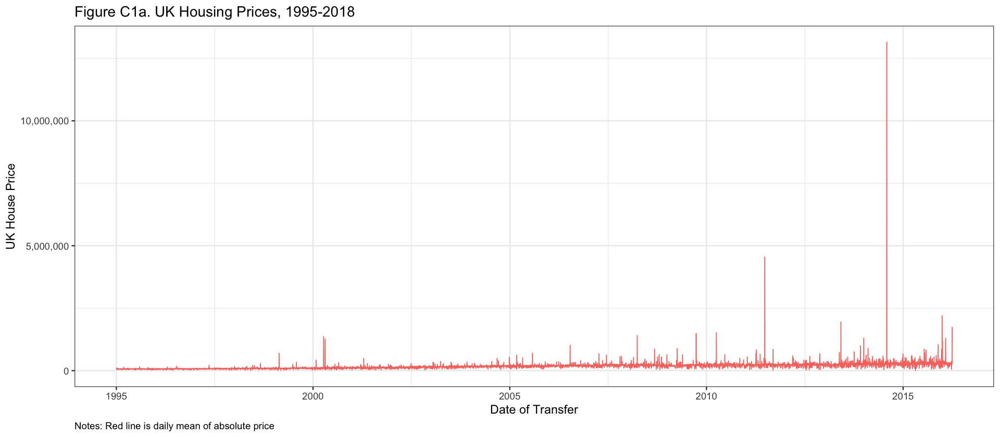

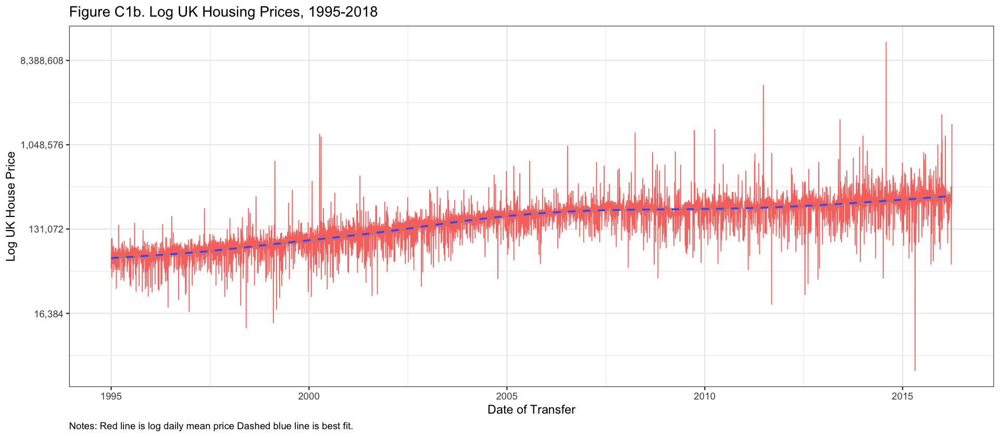

In [30]:
# Housing prices over time
require(scales)

# Absolute house prices
price_plot <- df %>%
    group_by(date_of_transfer) %>%
    summarise_at(vars(price), list(price_mean = mean, price_sd = sd)) %>%
    arrange(date_of_transfer) %>%
    ggplot(aes(x = date_of_transfer, 
               y = price_mean)) +
    geom_line(aes(color = "red")) +
    #geom_smooth(formula = y ~ s(x, bs = "cs"), method = 'gam', linetype = "dashed") +
    xlab("Date of Transfer") +
    ylab("UK House Price") +
    ggtitle("Figure C1a. UK Housing Prices, 1995-2018") +
    theme_bw(base_size = global_size) +
    theme(legend.position = "none", plot.caption = element_text(hjust = 0)) 
price_plot + 
    scale_y_continuous(labels = comma) +
    labs(caption = "Notes: Red line is daily mean of absolute price")

# Log house prices
price_plot + 
    geom_smooth(formula = y ~ s(x, bs = "cs"), method = 'gam', linetype = "dashed") +
    scale_y_continuous(trans = "log2", labels = comma) +
    ylab("Log UK House Price") +
    ggtitle("Figure C1b. Log UK Housing Prices, 1995-2018") +
    labs(caption = "Notes: Red line is log daily mean price Dashed blue line is best fit.") 

### C1.2 UK House Prices, 2015

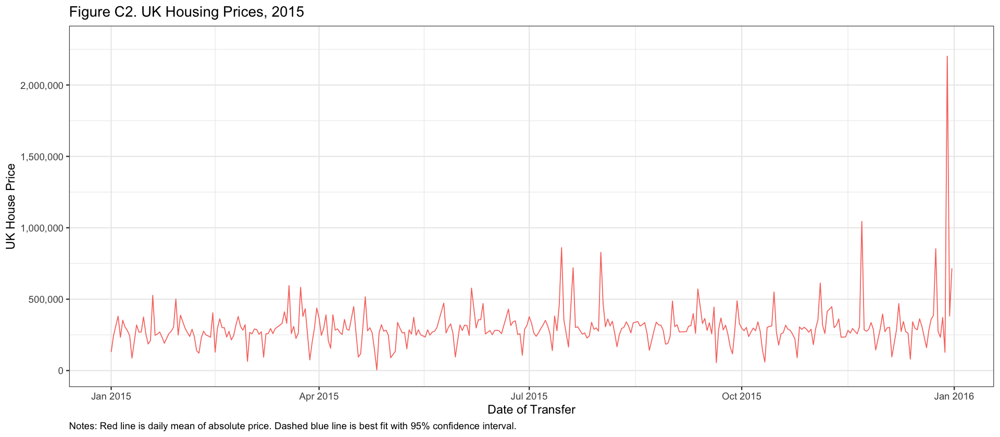

In [31]:
# Housing prices for 2015
price_p15 <- price_plot + scale_x_date(limits = as.Date(c("2015-01-01","2015-12-31"))) +
    ggtitle("Figure C2. UK Housing Prices, 2015") +
    labs(caption = "Notes: Red line is daily mean of absolute price. Dashed blue line is best fit with 95% confidence interval.") +
    scale_y_continuous(limits = c(0, 2300000), 
                       labels = comma) 
suppressWarnings(print(price_p15))

Property prices fluctuate put seem to have a slight increasing trend over the year 2015. The underlying trend as visualized by the smoothed line does not indicate an increasing trend throughout the year, however.

In [32]:
# Turn warnings on again
options(warn = defaultW)

## C2. Property Price Seasonality

<ins>Instructions</ins>
<br/>
Is there a significant relationship between the price of a property and the time of year it is sold? Does this vary with type of property?


### C2.1 Visualizing Relationsship over Years

By looking at the price development for different years, it is possible to investigate whether the slightly positive relationsship between prices and months in a given year holds for different years.

In [33]:
# Suppress Warnings
defaultW <- getOption("warn") 
options(warn = -1) 

In [34]:
# List years in dataset
table(format(df$date_of_transfer, format="%Y"))


  1995   1996   1997   1998   1999   2000   2001   2002   2003   2004   2005 
 94156 114388 128698 123871 140998 133196 146339 159571 147964 149031 125395 
  2006   2007   2008   2009   2010   2011   2012   2013   2014   2015   2016 
156617 149733  76505  73372  77871  78181  78835  96052 115512 116191  17524 

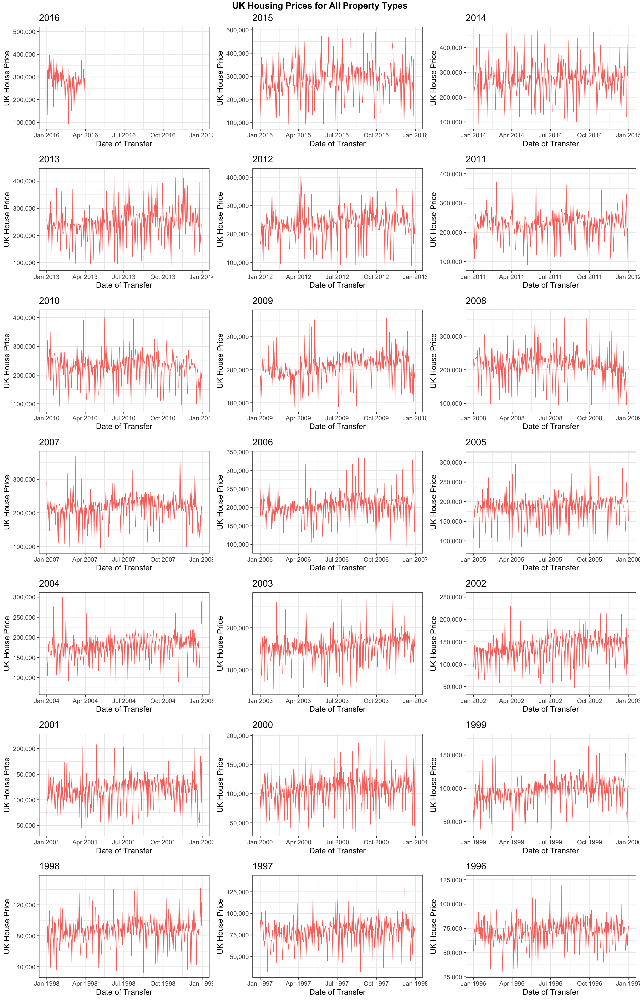

In [35]:
options(repr.plot.width=16, repr.plot.height=25)

# Save objects for loop
years = c(1995:2016)
plot_list = list()

# Run loop for subplots
for (k in years) {
    # Set iterable plotnames and time periods
    pname <- paste("price_p", k, sep = "")
    startdate <- paste(k, "-01-01", sep ="")
    enddate <- paste(k, "-12-31", sep ="")
    
    # Stor y-limits
    df$year <- year(df$date_of_transfer)
    ylimits <- df %>% subset(as.numeric(year) == k) %>% summarise_at(vars(price), list(Q1=~quantile(., probs = 0.10), Q3=~quantile(., probs = 0.90)))
    ymin <- as.integer(ylimits[1])
    ymax <- as.integer(ylimits[2])
                                                                     
    # Save subplot as plot
    plot <- price_plot + scale_x_date(limits = as.Date(c(startdate, enddate))) +
         ggtitle(paste(k)) +
         scale_y_continuous(limits = c(ymin, ymax),
                            labels = comma)
    
    # Set iterrated plots as plot name
    assign(pname, plot)
}

# # Combine plots
grid <- plot_grid(price_p2016, price_p2015, price_p2014, price_p2013, 
          price_p2012, price_p2011,
          price_p2010, price_p2009, price_p2008, price_p2007, price_p2006, price_p2005,
          price_p2004, price_p2003, price_p2002, price_p2001, price_p2000, price_p1999,
          price_p1998, price_p1997, price_p1996, price_p1995,
          ncol = 3, nrow = 7)
annotate_figure(grid, top = text_grob("UK Housing Prices for All Property Types", 
                                      face = "bold", 
                                      size = 16))

### C2.2 Relationsship For Different Property Types

In [36]:
# Value counts for property type
table(df$property_type)


     D      F      O      S      T 
574488 451116   4222 695921 774253 

In [37]:
# Save subdatasets for each property type
df_detach <- subset(df, df$property_type == "D")
df_sdetach <- subset(df, df$property_type == "S")
df_flat <- subset(df, df$property_type == "F")
df_terr <- subset(df, df$property_type == "T")
df_oth <- subset(df, df$property_type == "O")

#### C2.2.1 Detached Property Type

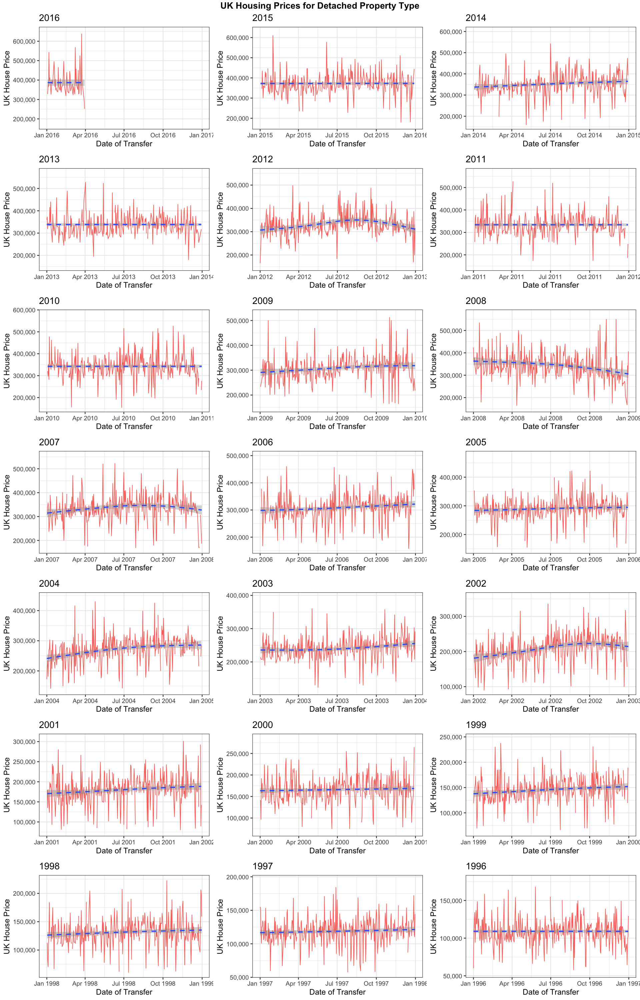

In [38]:
options(repr.plot.width=16, repr.plot.height=25)

# Save objects for loop
years = c(1995:2016)
plot_list = list()

# Run loop for subplots
for (k in years) {
    # Set iterable plotnames and time periods
    pname <- paste("price_p", k, sep = "")
    startdate <- paste(k, "-01-01", sep ="")
    enddate <- paste(k, "-12-31", sep ="")
    
    # Stor y-limits
    df_detach$year <- year(df_detach$date_of_transfer)
    ylimits <- df_detach %>% subset(as.numeric(year) == k) %>% summarise_at(vars(price), list(Q1=~quantile(., probs = 0.10), Q3=~quantile(., probs = 0.90)))
    ymin <- as.integer(ylimits[1])
    ymax <- as.integer(ylimits[2])
                                                                     
    # Save subplot as plot
    plot <- df_detach %>%
        group_by(date_of_transfer) %>%
        summarise_at(vars(price), list(price_mean = mean, price_sd = sd)) %>%
        arrange(date_of_transfer) %>%
        ggplot(aes(x = date_of_transfer, 
                   y = price_mean)) +
        geom_line(aes(color = "red")) +
        geom_smooth(formula = y ~ s(x, bs = "cs"), method = 'gam', linetype = "dashed") +
        xlab("Date of Transfer") +
        ylab("UK House Price") +
        theme_bw(base_size = global_size) +
        theme(legend.position = "none", plot.caption = element_text(hjust = 0)) +
        scale_x_date(limits = as.Date(c(startdate, enddate))) +
        ggtitle(paste(k)) +
        scale_y_continuous(limits = c(ymin, ymax),
                            labels = comma)
    
    # Set iterrated plots as plot name
    assign(pname, plot)
}

# Combine plots
grid <- plot_grid(price_p2016, price_p2015, price_p2014, price_p2013, 
          price_p2012, price_p2011,
          price_p2010, price_p2009, price_p2008, price_p2007, price_p2006, price_p2005,
          price_p2004, price_p2003, price_p2002, price_p2001, price_p2000, price_p1999,
          price_p1998, price_p1997, price_p1996, price_p1995,
          ncol = 3, nrow = 7)
annotate_figure(grid, top = text_grob("UK Housing Prices for Detached Property Type", 
                                      face = "bold", 
                                      size = 16))

#### C2.2.2 Semi-Detached Property Type

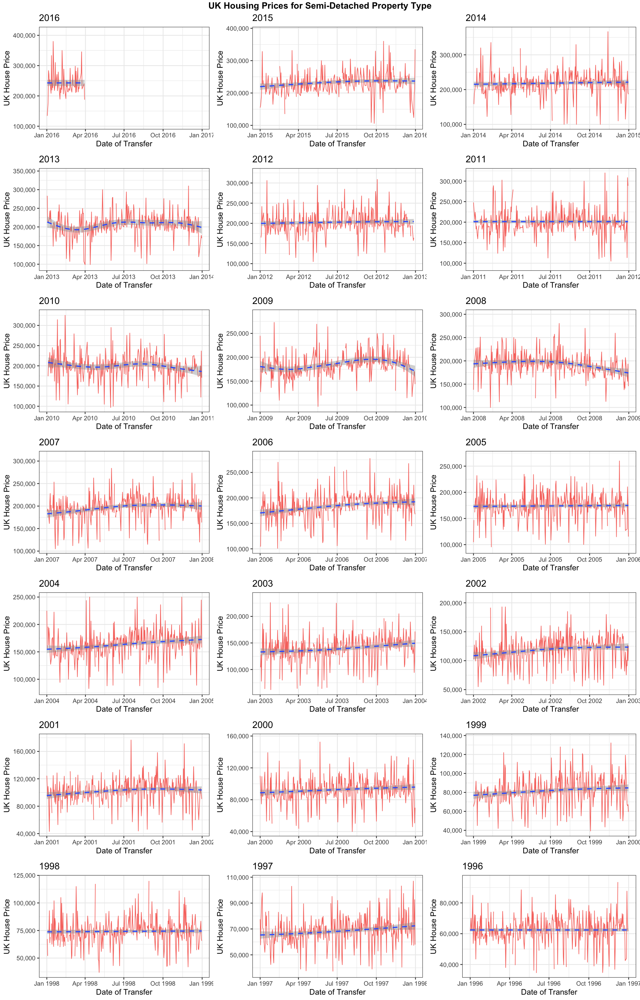

In [39]:
options(repr.plot.width=16, repr.plot.height=25)

# Save objects for loop
years = c(1995:2016)
plot_list = list()

# Run loop for subplots
for (k in years) {
    # Set iterable plotnames and time periods
    pname <- paste("price_p", k, sep = "")
    startdate <- paste(k, "-01-01", sep ="")
    enddate <- paste(k, "-12-31", sep ="")
    
    # Stor y-limits
    df_sdetach$year <- year(df_sdetach$date_of_transfer)
    ylimits <- df_sdetach %>% subset(as.numeric(year) == k) %>% summarise_at(vars(price), list(Q1=~quantile(., probs = 0.10), Q3=~quantile(., probs = 0.90)))
    ymin <- as.integer(ylimits[1])
    ymax <- as.integer(ylimits[2])
                                                                     
    # Save subplot as plot
    plot <- df_sdetach %>%
        group_by(date_of_transfer) %>%
        summarise_at(vars(price), list(price_mean = mean, price_sd = sd)) %>%
        arrange(date_of_transfer) %>%
        ggplot(aes(x = date_of_transfer, 
                   y = price_mean)) +
        geom_line(aes(color = "red")) +
        geom_smooth(formula = y ~ s(x, bs = "cs"), method = 'gam', linetype = "dashed") +
        xlab("Date of Transfer") +
        ylab("UK House Price") +
        theme_bw(base_size = global_size) +
        theme(legend.position = "none", plot.caption = element_text(hjust = 0)) +
        scale_x_date(limits = as.Date(c(startdate, enddate))) +
        ggtitle(paste(k)) +
        scale_y_continuous(limits = c(ymin, ymax),
                            labels = comma)
    
    # Set iterrated plots as plot name
    assign(pname, plot)
}

# Combine plots
grid <- plot_grid(price_p2016, price_p2015, price_p2014, price_p2013, 
          price_p2012, price_p2011,
          price_p2010, price_p2009, price_p2008, price_p2007, price_p2006, price_p2005,
          price_p2004, price_p2003, price_p2002, price_p2001, price_p2000, price_p1999,
          price_p1998, price_p1997, price_p1996, price_p1995,
          ncol = 3, nrow = 7)
annotate_figure(grid, top = text_grob("UK Housing Prices for Semi-Detached Property Type", 
                                      face = "bold", 
                                      size = 16))

#### C2.2.3 Flats

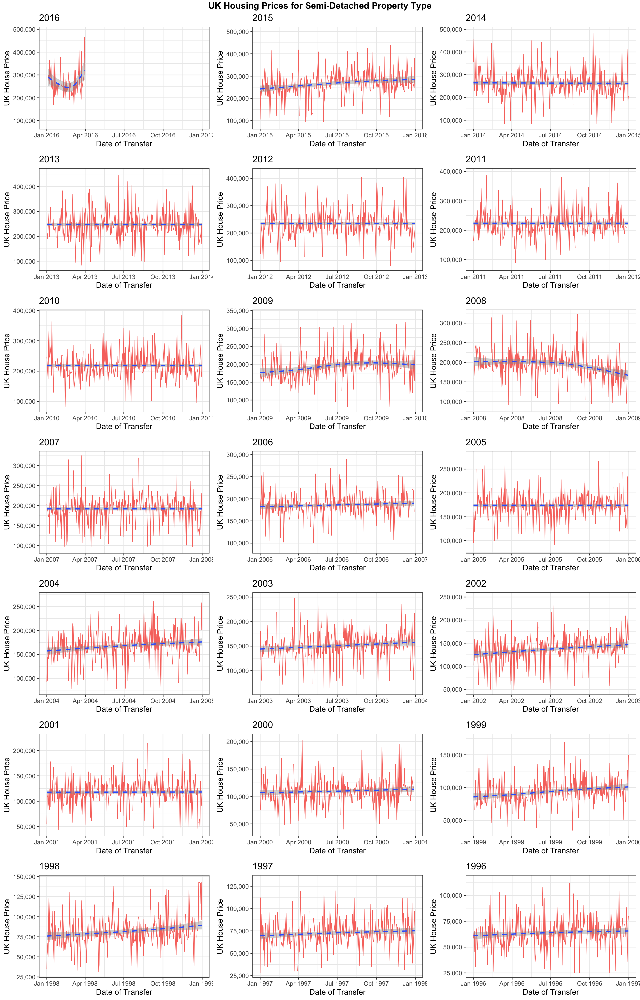

In [40]:
options(repr.plot.width=16, repr.plot.height=25)

# Save objects for loop
years = c(1995:2016)
plot_list = list()

# Run loop for subplots
for (k in years) {
    # Set iterable plotnames and time periods
    pname <- paste("price_p", k, sep = "")
    startdate <- paste(k, "-01-01", sep ="")
    enddate <- paste(k, "-12-31", sep ="")
    
    # Stor y-limits
    df_flat$year <- year(df_flat$date_of_transfer)
    ylimits <- df_flat %>% subset(as.numeric(year) == k) %>% summarise_at(vars(price), list(Q1=~quantile(., probs = 0.10), Q3=~quantile(., probs = 0.90)))
    ymin <- as.integer(ylimits[1])
    ymax <- as.integer(ylimits[2])
                                                                     
    # Save subplot as plot
    plot <- df_flat %>%
        group_by(date_of_transfer) %>%
        summarise_at(vars(price), list(price_mean = mean, price_sd = sd)) %>%
        arrange(date_of_transfer) %>%
        ggplot(aes(x = date_of_transfer, 
                   y = price_mean)) +
        geom_line(aes(color = "red")) +
        geom_smooth(formula = y ~ s(x, bs = "cs"), method = 'gam', linetype = "dashed") +
        xlab("Date of Transfer") +
        ylab("UK House Price") +
        theme_bw(base_size = global_size) +
        theme(legend.position = "none", plot.caption = element_text(hjust = 0)) +
        scale_x_date(limits = as.Date(c(startdate, enddate))) +
        ggtitle(paste(k)) +
        scale_y_continuous(limits = c(ymin, ymax),
                            labels = comma)
    
    # Set iterrated plots as plot name
    assign(pname, plot)
}

# Combine plots
grid <- plot_grid(price_p2016, price_p2015, price_p2014, price_p2013, 
          price_p2012, price_p2011,
          price_p2010, price_p2009, price_p2008, price_p2007, price_p2006, price_p2005,
          price_p2004, price_p2003, price_p2002, price_p2001, price_p2000, price_p1999,
          price_p1998, price_p1997, price_p1996, price_p1995,
          ncol = 3, nrow = 7)
annotate_figure(grid, top = text_grob("UK Housing Prices for Semi-Detached Property Type", 
                                      face = "bold", 
                                      size = 16))

#### C2.2.4 Terraced

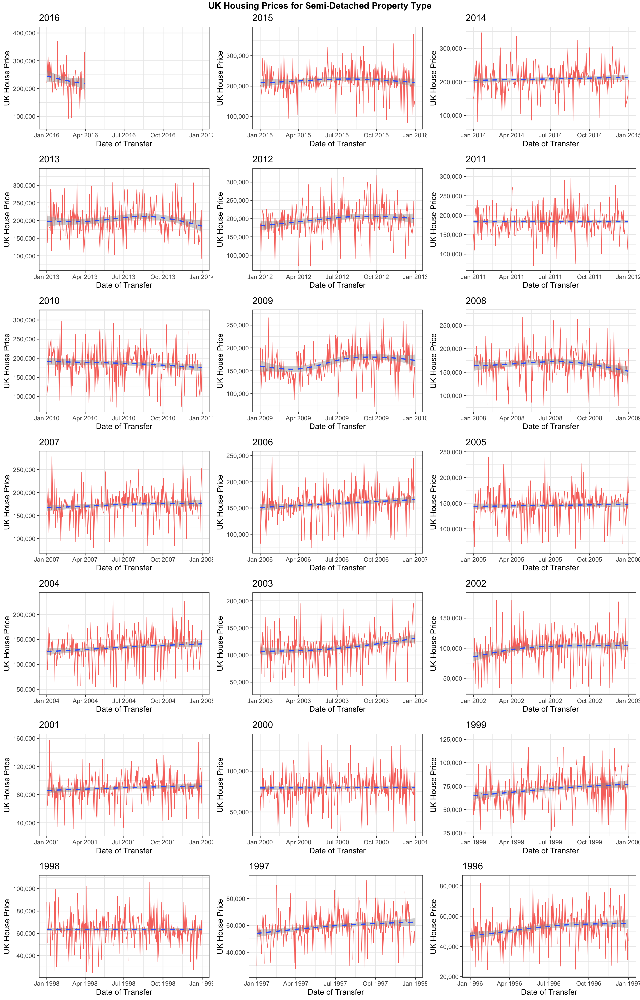

In [41]:
options(repr.plot.width=16, repr.plot.height=25)

# Save objects for loop
years = c(1995:2016)
plot_list = list()

# Run loop for subplots
for (k in years) {
    # Set iterable plotnames and time periods
    pname <- paste("price_p", k, sep = "")
    startdate <- paste(k, "-01-01", sep ="")
    enddate <- paste(k, "-12-31", sep ="")
    
    # Stor y-limits
    df_terr$year <- year(df_terr$date_of_transfer)
    ylimits <- df_terr %>% subset(as.numeric(year) == k) %>% summarise_at(vars(price), list(Q1=~quantile(., probs = 0.10), Q3=~quantile(., probs = 0.90)))
    ymin <- as.integer(ylimits[1])
    ymax <- as.integer(ylimits[2])
                                                                     
    # Save subplot as plot
    plot <- df_terr %>%
        group_by(date_of_transfer) %>%
        summarise_at(vars(price), list(price_mean = mean, price_sd = sd)) %>%
        arrange(date_of_transfer) %>%
        ggplot(aes(x = date_of_transfer, 
                   y = price_mean)) +
        geom_line(aes(color = "red")) +
        geom_smooth(formula = y ~ s(x, bs = "cs"), method = 'gam', linetype = "dashed") +
        xlab("Date of Transfer") +
        ylab("UK House Price") +
        theme_bw(base_size = global_size) +
        theme(legend.position = "none", plot.caption = element_text(hjust = 0)) +
        scale_x_date(limits = as.Date(c(startdate, enddate))) +
        ggtitle(paste(k)) +
        scale_y_continuous(limits = c(ymin, ymax),
                            labels = comma)
    
    # Set iterrated plots as plot name
    assign(pname, plot)
}

# Combine plots
grid <- plot_grid(price_p2016, price_p2015, price_p2014, price_p2013, 
          price_p2012, price_p2011,
          price_p2010, price_p2009, price_p2008, price_p2007, price_p2006, price_p2005,
          price_p2004, price_p2003, price_p2002, price_p2001, price_p2000, price_p1999,
          price_p1998, price_p1997, price_p1996, price_p1995,
          ncol = 3, nrow = 7)
annotate_figure(grid, top = text_grob("UK Housing Prices for Semi-Detached Property Type", 
                                      face = "bold", 
                                      size = 16))

#### C2.2.5 Other

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



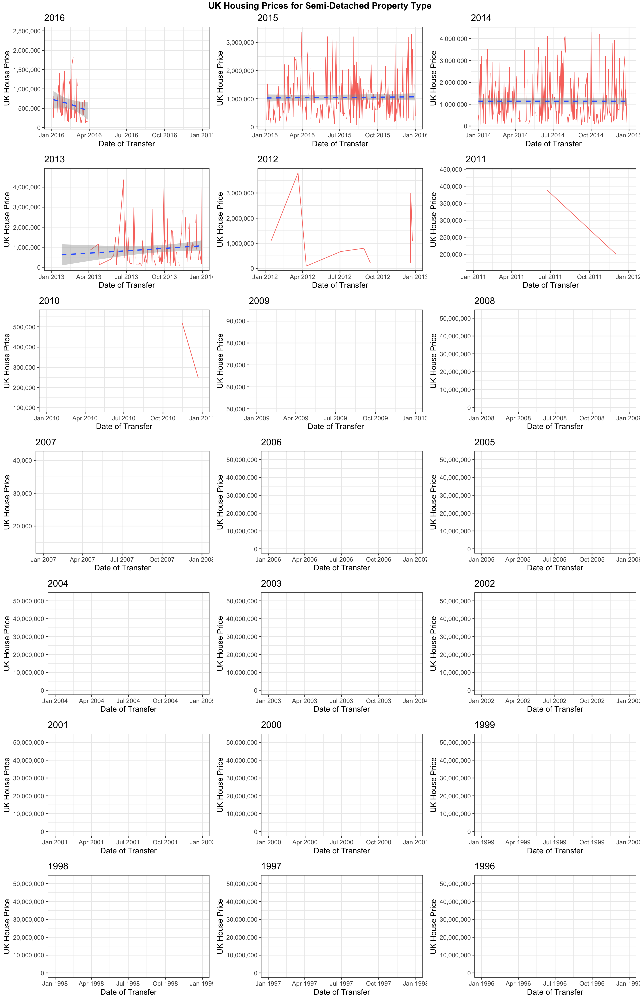

In [42]:
options(repr.plot.width=16, repr.plot.height=25)

# Save objects for loop
years = c(1995:2016)
plot_list = list()

# Run loop for subplots
for (k in years) {
    # Set iterable plotnames and time periods
    pname <- paste("price_p", k, sep = "")
    startdate <- paste(k, "-01-01", sep ="")
    enddate <- paste(k, "-12-31", sep ="")
    
    # Stor y-limits
    df_oth$year <- year(df_oth$date_of_transfer)
    ylimits <- df_oth %>% subset(as.numeric(year) == k) %>% summarise_at(vars(price), list(Q1=~quantile(., probs = 0.10), Q3=~quantile(., probs = 0.90)))
    ymin <- as.integer(ylimits[1])
    ymax <- as.integer(ylimits[2])
                                                                     
    # Save subplot as plot
    plot <- df_oth %>%
        group_by(date_of_transfer) %>%
        summarise_at(vars(price), list(price_mean = mean, price_sd = sd)) %>%
        arrange(date_of_transfer) %>%
        ggplot(aes(x = date_of_transfer, 
                   y = price_mean)) +
        geom_line(aes(color = "red")) +
        geom_smooth(formula = y ~ s(x, bs = "cs"), method = 'gam', linetype = "dashed") +
        xlab("Date of Transfer") +
        ylab("UK House Price") +
        theme_bw(base_size = global_size) +
        theme(legend.position = "none", plot.caption = element_text(hjust = 0)) +
        scale_x_date(limits = as.Date(c(startdate, enddate))) +
        ggtitle(paste(k)) +
        scale_y_continuous(limits = c(ymin, ymax),
                            labels = comma)
    
    # Set iterrated plots as plot name
    assign(pname, plot)
}

# Combine plots
grid <- plot_grid(price_p2016, price_p2015, price_p2014, price_p2013, 
          price_p2012, price_p2011,
          price_p2010, price_p2009, price_p2008, price_p2007, price_p2006, price_p2005,
          price_p2004, price_p2003, price_p2002, price_p2001, price_p2000, price_p1999,
          price_p1998, price_p1997, price_p1996, price_p1995,
          ncol = 3, nrow = 7)
annotate_figure(grid, top = text_grob("UK Housing Prices for Semi-Detached Property Type", 
                                      face = "bold", 
                                      size = 16))